# Baseline Regression

## Preprocessing
The supplied raw data txt-files are made up of 100 replicate measurements/spectrums for each condition. The filenames are structured as Datasetname_EXXmJ_Gd_XXus, where mJ is the unit for laser energy and µs the unit for gate delay.
Consequently a dataset is seperated into three classes in within the ``datalayers.py`` module:
- ``Dataset``: the dataset itself
- ``Condition``: specified by laser energy and gate delay
- ``Spectrum``: specified by replicate number

The classes are connected by class composition in descending order, since it is more flexible than class inheritance.

### Initialization
By intialization of the ``Dataset(...)`` object, the dataset name gets extracted from the folder structure and a dataframe containing all filepaths with corresponding laser energy, gate delays and condition objects is generated. To cut computiation time later on, the dataset object gets stored as a pickle file into '../temp' and is reloaded unless otherwise stated.

### Interpolation and removal of dead pixels
Due to dead pixels, the files for each condition contain several 0 values. These values need to be interpolated prior further calculations. For interpolation, a linear regression is used with 2 values before and after the wavelengths with dead pixels. This is implemented as a ``Condition.interpolate_dead_pixels(...)`` Within this method, it is also checked, that the wavelength does not contain information across all replicate measurements. So wavelengths where zero is measured as the real value do not get interpolated. Wavelengths with no itensity at the end of the spectrum are deleted as well.

To illustrate the procedures, the dataset of the low alloyed steel sample SUS-1R is used.

Dataset: SUS-1R
Files of dataset loaded
Condition: Laser energy: 5 mJ | Gate delay: 500 µs
Dead pixels interpolated from 883.08 nm to 885.48  nm
Dead pixels interpolated from 941.94 nm to 948.76  nm
Empty pixels at the end of spectra deleted from 1000.02 nm to 1499.98  nm
Spectrum: replicate no. 99


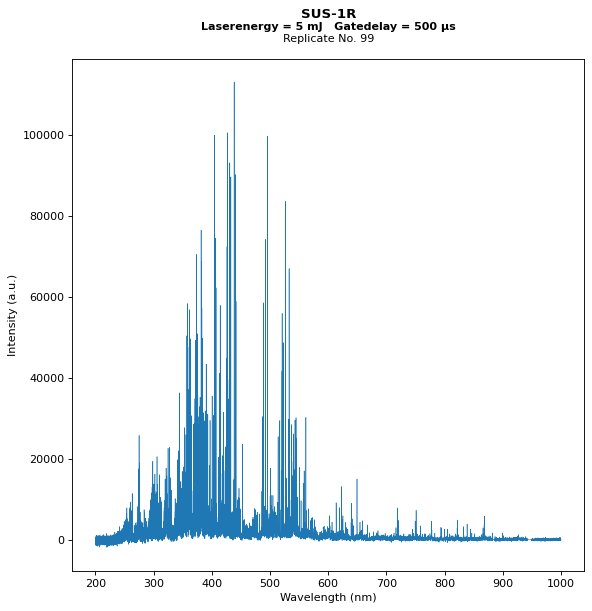

In [2]:
import os, sys
if os.path.dirname(os.getcwd()) not in sys.path:
    sys.path.insert(0, os.path.dirname(os.getcwd()))
import importlib
import lib.datalayers as dly
importlib.reload(dly)
dataset = dly.Dataset(r'..\data\raw data txt\SUS_1R')
condition = dly.Condition(dataset, laser_energy=5, gate_delay=500)
condition.interpolate_dead_pixels()
spectrum = dly.Spectrum(dataset, cond=condition, repno=99)
spectrum.plot_spectrum(baseline=False, figsizex=8, figsizey=8, dpi=80)
spectrum.DEBUG = False

## Fit
Polynoms were used for baseline regression, due to their simple calculation and well managable coefficients aiming to perform bilinear baseline modelling in dependency of gate delay and laser energy later on. Beside polynomials, splines and the Liebers algorithm were taken into consideration as well. However, the reproducible calculation of spline coefficients is difficult and the Liebers algorithm only results in a list of numeric values.

### Identifying pivot points
To find the anchor points of the polynomial baseline, a moving minimum filter was applied as part of the method ``Spectrum.Baseline.find_pivot_points(...)``. Best results were obtained with a window of 40 nm and steps of half of the window width. Since using minimums lead to low intercepts (the baseline is below the data and not within the data). The y-value at the position of the minimums were replaced by the median values including 4 values before and after the minimum point. This rose the intercept and the polynom.

### Feature selection
Throughout polynomial regression it was opted for hierarchical polynomials (including all coefficients till the highest degree). Hierarchical polynoms have the benefits to easily build cross-terms while baseline modelling later on. [1].
To select the best polynomial degree, a tool to perform hierarchical feature selection (as well as bidirectional feautre selection) was custom build. The custom selector is included in the ``transformer.py`` module as ``Selector``. The selector was also designed to be compatible with modules of the scikit-learn library. As a scoring criteria, the value of the F-statistic was selected.
The custom ``Selector`` also includes an algorithm to check for the significance of coefficients by their p-value. Throughout optimization, the highest coefficients were omitted successively until the p-value of the highest coefficient was below significance level. Non-significant coefficients within the polynom were accepted to sustain the structure of hierarchical polynomials.
If it was not possible to fit a polynom by the applied constraints, a flat line with intercept 0 is returned.
The overall polynomial regression was performed as part of a scikit-learn pipeline within the method ``Spectrum.Baseline.calculate_regression(...)`` with the value of F-statistic as default scoring method and a significance level of 0.05. Furthermore, the minimum polynomial degree was set to 3 to avoid severe underfitting. The maximum degree was set to 5 by default to avoid too large numerical values.

### Usage of shifted polynoms
During development, it was observed, that polynoms, which fit quite well visually, have high p-values for their coefficients. This problem was caused due to a numerical problem when calculating with high potences of the wavelength. Values to a higher power lead to big numerical values and big values show a higher collinearity between them, eventhough the same calculations with lower x-values would not. To avoid false results, the x-values were centered around their mean. This was performed with the transformer ``ShiftData`` included in the ``transformer.py`` module.

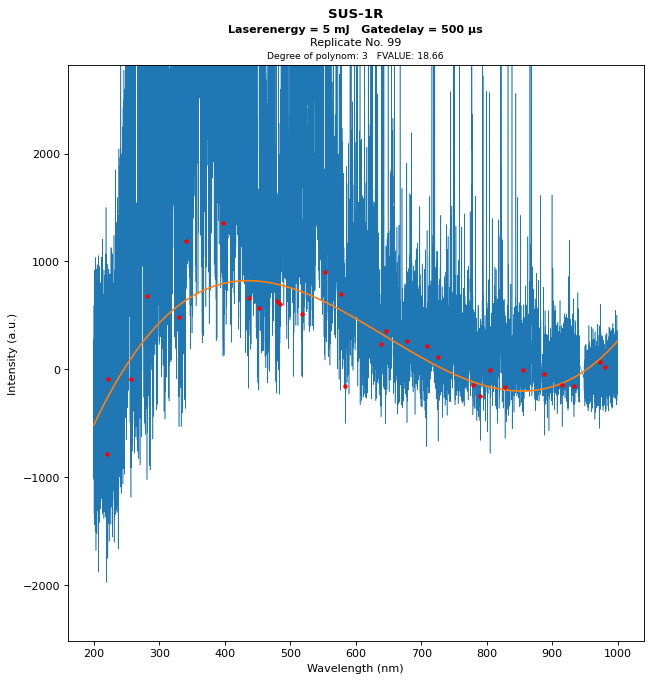

In [3]:
spectrum.baseline.find_pivot_points(width_wvn=40, width_wvn_detail=0, detailfactor=1, reverse=False)
spectrum.baseline.calculate_regression(endpoint_weight=1, deg_min=3)
spectrum.plot_spectrum(baseline=True, view="detail", figsizex=9, figsizey=9, dpi=80)

### Optimisation
Since the first draft for pivot point identification and polynomial regression did not lead to satisfactory results, several options to modify the algorithms had to be added. The following options were only used if necessary and were not applied for all datasets.  
The most obvious problem of the applied procedure was underfitting at the upper end of the spectrum due to a lack of appropriate pivot points. To solve this issue, the steps of the minimum filter were decreased by a given detailfactor (e.g. 10) from 1/2 to 1/(2*detailfactor) of the window width (40 nm) within a defined wavelength range (e.g.: 20 nm) at the start and end of the spectrum.

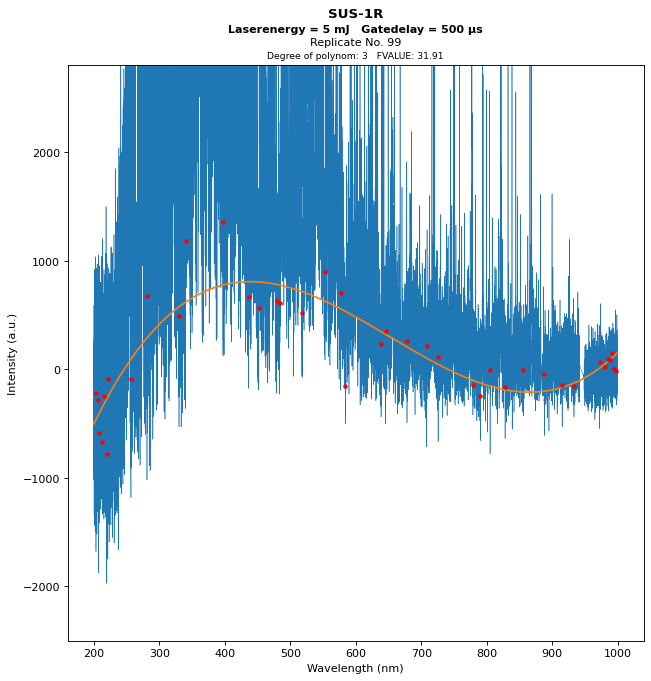

In [6]:
spectrum.baseline.find_pivot_points(width_wvn=40, width_wvn_detail=20, detailfactor=10, reverse=False)
spectrum.baseline.calculate_regression(endpoint_weight=1, deg_min=3)
spectrum.plot_spectrum(baseline=True, view="detail", figsizex=9, figsizey=9, dpi=80)

Since this measure only improved the fit slightly, weighted least squares regression was used. With this method the first and last three points of the spectra achieved a higher weight (endpoint weight > 1).

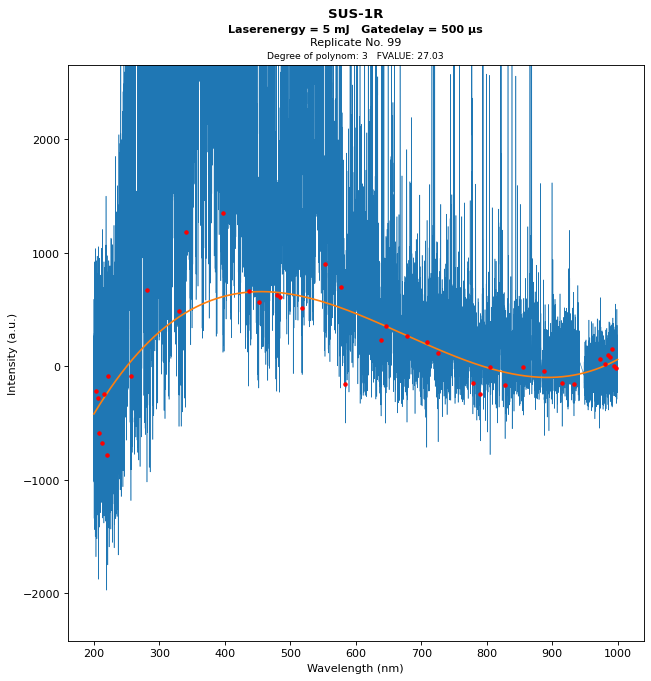

In [7]:
spectrum.baseline.find_pivot_points(width_wvn=40, width_wvn_detail=20, detailfactor=10, reverse=False)
spectrum.baseline.calculate_regression(endpoint_weight=10000, deg_min=3)
spectrum.plot_spectrum(baseline=True, view="detail", figsizex=9, figsizey=9, dpi=80)
x_min_without_reverse = spectrum.x_min

The endpoint weight was able to improve the fit significantly for the given example. However, one more reason for a worse fit at the upper end of spectrum was identified. It was found that less pivot points were present at the upper end compared to the lower end which might result in a poorer fit. Therethrough, the minimum filter for pivot point identifcation was run in both directions providing more pivot points.

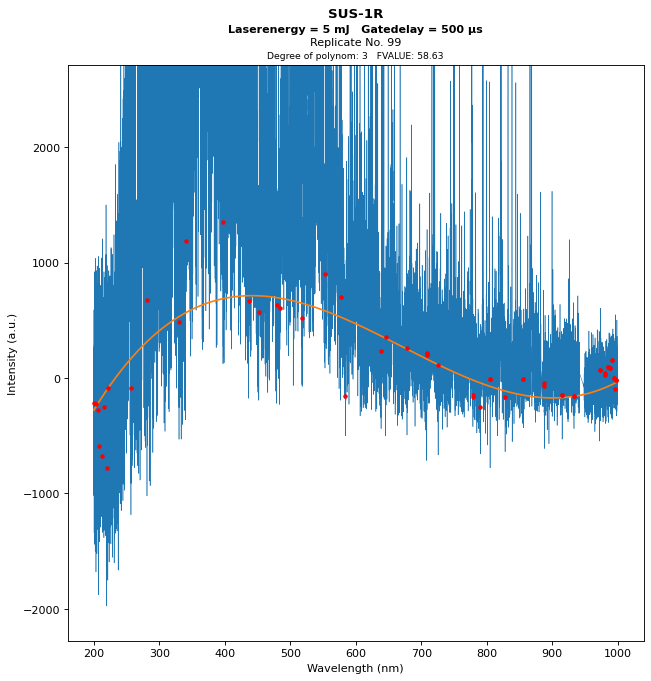

In [11]:
spectrum.baseline.find_pivot_points(width_wvn=40, width_wvn_detail=20, detailfactor=10, reverse=True)
spectrum.baseline.calculate_regression(endpoint_weight=10000, deg_min=3)
spectrum.plot_spectrum(baseline=True, view="detail", figsizex=9, figsizey=9, dpi=80)
x_min_with_reverse = spectrum.x_min

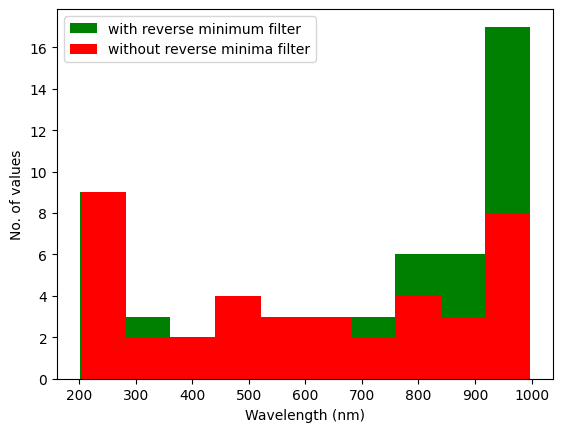

In [9]:
from matplotlib import pyplot as plt
plt.hist(x_min_with_reverse, color="green", label="with reverse minimum filter")
plt.hist(x_min_without_reverse, color="red", label="without reverse minima filter")
plt.xlabel("Wavelength (nm)")
plt.ylabel("No. of values")
plt.legend()

It was possible to find an adequate baseline fit for all spectra throughout the datasets with these options (detailed window width, detailfactor, reverse run, endpoint weight).

Yet, the problem of high collinearity between coefficients was not resolved due to the character of polynomial coefficients. To deal with collinear coefficients in polynomial regression, orthogonal polynomials would be an option.[2] However, the coefficients of orthogonal polynomials can not be interpreted and the conversion to normal coefficients is demanding.[3] This would succeed the scope of this work and is not mandatory, since the aim is a to proof the concept of empirical simulation.

[1] https://home.iitk.ac.in/~shalab/regression/Chapter12-Regression-PolynomialRegression.pdf    
[2] https://www.maths.usyd.edu.au/u/UG/SM/STAT3022/r/current/Lecture/lecture12_2020JC.html#12   
[3] https://stats.stackexchange.com/questions/31858/recovering-raw-coefficients-and-variances-from-orthogonal-polynomial-regression

# Baseline Simulation

## Principle
The aim is to model each baseline coefficient with a bilinear model based on laser energy and gate delay and their interaction terms. Given the formula of a baseline regression polynom
$$p_{baseline \ regression}(\lambda) = a_{br0} + a_{br1} \cdot (\lambda-\lambda_{shift}) + a_{br2} \cdot (\lambda-\lambda_{shift}) ^2 + a_{br3} \cdot (\lambda-\lambda_{shift}) ^3 $$
the full model for a coefficient $a_{br\ i}$ would be
$$a_{{br\ i}_{model}} (LE, GD) = a_{{br\ i}_{m0}} + a_{{br\ i}_{m1}} \cdot LE + a_{{br\ i}_{m2}} \cdot GD + a_{{br\ i}_{m3}} \cdot LE^2 + a_{{br\ i}_{m4}} \cdot GD^2 + a_{{br\ i}_{m5}} \cdot LE \cdot GD$$
Then, the general model quation for a baseline would be of the following form:
$$p_{baseline \ model}(LE, GD, \lambda) = a_{{br0}_{model}}(LE,GD) + a_{{br1}_{model}}(LE,GD) \cdot (\lambda-\lambda_{shift}) + a_{{br2}_{model}}(LE,GD) \cdot (\lambda-\lambda_{shift}) ^2 + a_{{br3}_{model}}(LE,GD) \cdot (\lambda-\lambda_{shift}) ^3 $$

\
\
The model it self is seperated into two classes within the ``model.py`` module:
- ``Baseline``: provides the baseline model by uniting models for each coefficient $a_{{br i}_{model}} (LE, GD)$
- ``Coefficient``: generates a model for a coefficient
    - connected to ``Baseline`` by class composition

## Modeling
### Identify median polynomial degree within dataset
To build the baseline model, it was necessary to get a baseline polynom of each spectrum including the same coefficients. Therefore, the distribution of polynomial degrees for a dataset was analyzed and the dataset was refitted with the identified median degree.

To visualize the data of an entire dataset, the method ``Dataset.plot_dataset(...)`` can be used.

Calculate plot: 100%|██████████| 15/15 [02:18<00:00,  9.25s/it]


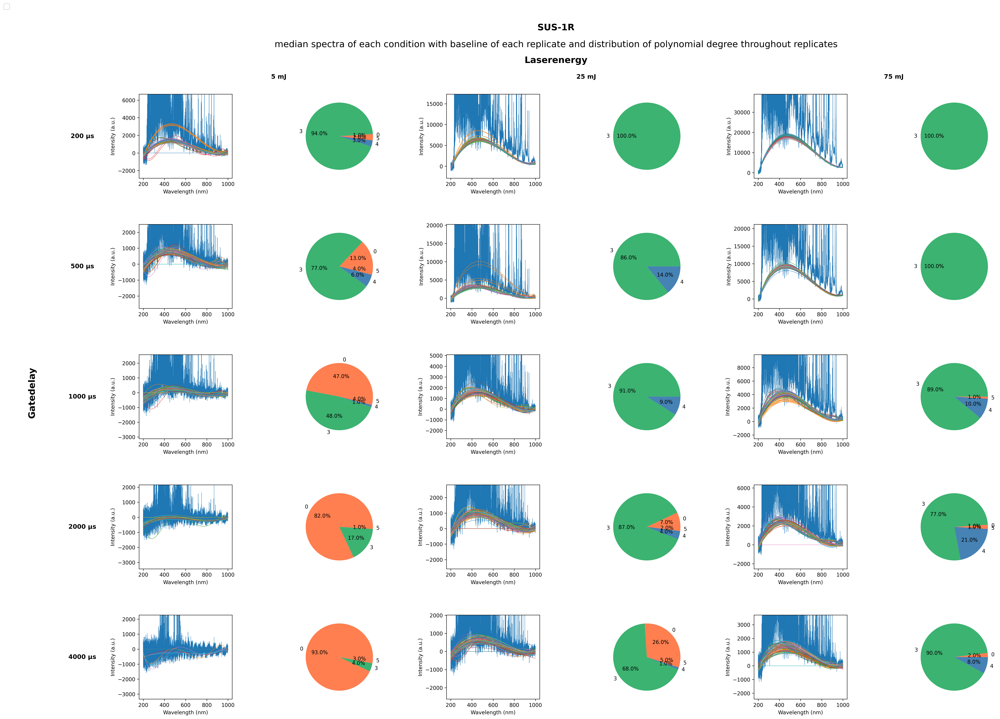

In [2]:
dataset.plot_dataset(type_list=["stability", "pie"], deg_min=3, width_wvn=40, detailfactor=10, endpoint_weight=10000, reverse=True)

Calculate plot: 100%|██████████| 15/15 [01:36<00:00,  6.42s/it]


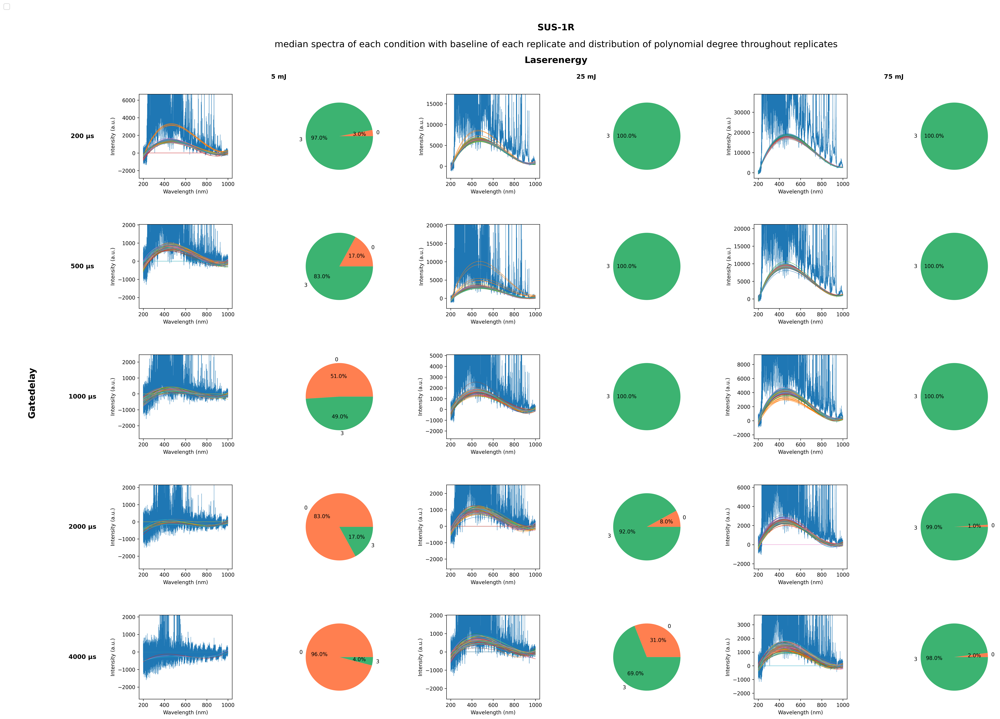

In [3]:
dataset.plot_dataset(type_list=["stability", "pie"], deg_min=3, deg_max=3, width_wvn=40, detailfactor=10, endpoint_weight=10000, reverse=True)

The coefficients of each spectrum of a dataset were summarized as a pandas DataFrame with the method ``Dataset.summarize_baseline_coefficients(...)``. Beside of the dataframe, the method also returned a dictionary of the applied settings at baseline regression. The dataframe was also stored as a txt file into "../results/dataset_name".  
To cut computation time, the summarize-dataframe is loaded from the stored txt file unless otherwise stated.

In [10]:
summary_baseline_coeff_regression, baseline_regression_settings =dataset.summarize_baseline_coefficients(deg_min=3, deg_max=3, width_wvn=40, detailfactor=10, endpoint_weight=10000, reverse=True,  overwrite=False)

Calculate summary_baseline_coeff::   0%|          | 0/15 [00:03<?, ?it/s]


### Preprocseesing
#### Calculate median polynomial coefficients
Since it was not possible to fit a baseline with the median common degree to each spectrum, the spectrums with no fit (only 0 coefficients) were omitted.
Furthermore, it was observed, that using median coefficients for each condition instead of all available measurements of a condition for the model lead to an increase of model quality.

#### Transformation and Scaling
The feature matrix and targets were transformed and normalized.
For the feature matrix (intercept, LE, GD, LE^2, GD^2, LE*GD) it was noticed not to transform and normalize the intercept column. For transformation, the Yeo-Johnson-method with subsequent zero-mean, unit-varirance normalization was applied as part of scikit-learns ``PowerTransformer``.  
The application of the ``PowerTransformer`` was not possible to the target (the values for each coefficient a_i), since retransformation resulted in a division by zero due to rounding errors (values too close to zero) for some targets. Therefore, the custom transformer ``SkewScaleTransformer`` within ``transformer.py`` was built. This transformer applied log-transformation of absolute values and kept the median sign of the target to be used in retransformation. For scaling, scikit-learns ``StandardScaler`` was used. Furthermore, it was not possible to embed a transformer for targets into scikit-learn pipelines, since transformers within pipelines are only supposed for features. Thatswhy the transformer was applied manually before using the pipeline.

### Feature Selection and Fit
For feature selection, bidirectional stepwise regression was applied and non significant coefficients were discarded. Thereby non-hierarchical polynoms were possible as models for simulation.
The maximum degree of the model polynom was set to 2.

The fitted model was stored as pickle file into '../models/dataset_name' and the model polynoms for each coefficient were stored in a txt file with the method ``Baseline.summary_coeff_models()``

### Model Assessment
To assess the quality of the model, four different plots were used:
- prediction vs. calculated plot, residual plot, histogram of residuals as part of the method ``Baseline.model_assessment_plot()``
- stability plot with modeled baselines for 1000 randomized conditions within the limits for laser energy and gate delay of a dataset implemented in the method ``Baseline.model_stability_plot()``


Fit model: 100%|██████████| 4/4 [00:00<00:00,  9.05it/s]


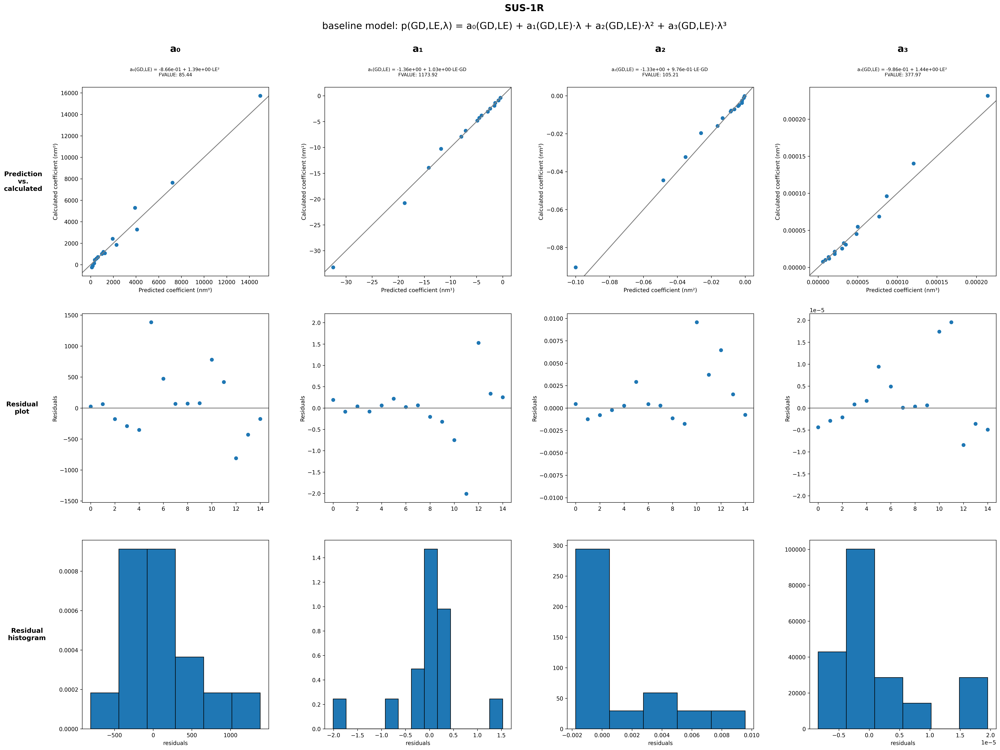

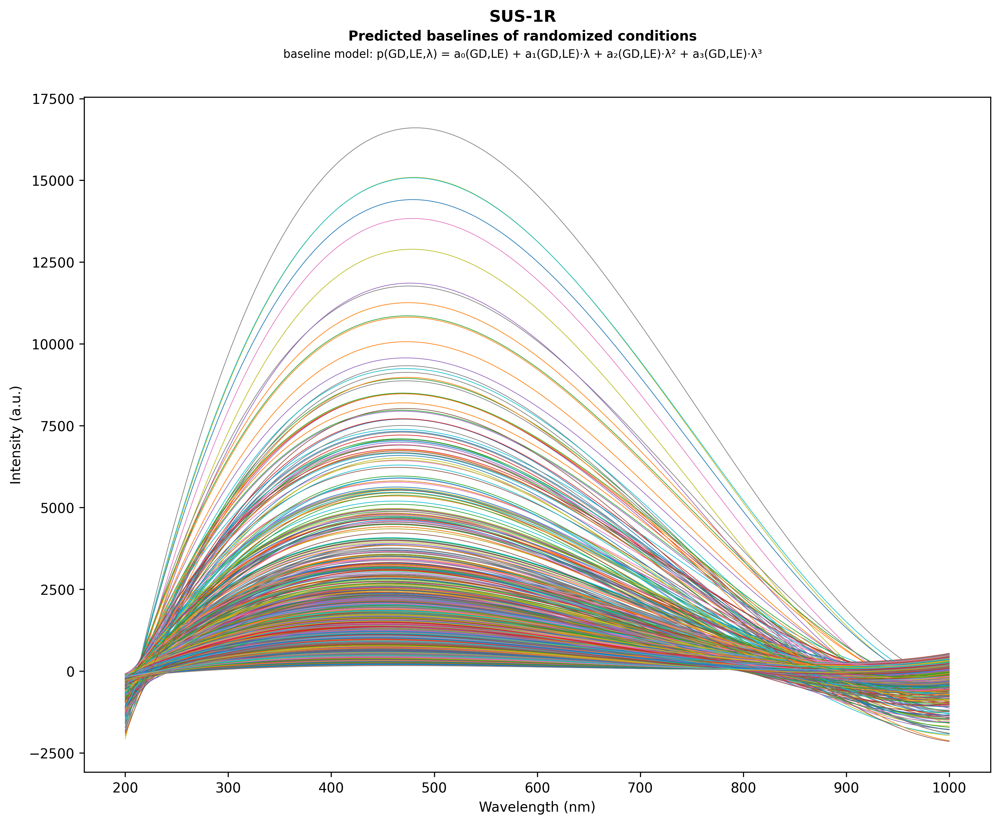

In [7]:
import lib.model as mod
importlib.reload(mod)
baseline = mod.Baseline(dataset.name, summary_baseline_coeff_regression, baseline_regression_settings, median=True)
baseline_model = baseline.model.fit(transform_x=True, transform_y=True)
baseline.summary_coeff_models()
baseline.model_assessment_plot()
baseline.model_stabilty_plot(dataset.wavelength_range)

## Simulation

If the model object is already generated it can be used to predict the baseline coefficients for a hierarchical polynom. Otherwise the baseline model need to be loaded from the pickle file from the folder '../models/dataset_name'. It should be noted, that the predicted baseline coefficients only work with shifted wavelength values. The shift value for each dataset is stored into the summary file for baseline regression.

In [8]:
baseline_model.predict(laser_energy=5, gate_delay=500)

[515.8279299387917,
 -2.402573261240845,
 -0.0036281022455627978,
 2.092466276053654e-05]

The baseline model can also be used as an input argument to the dataset plot method ``dataset.plot_dataset(...)`` to compare the simulated baseline against baselines of all replicates or the median baseline.

Calculate plot: 100%|██████████| 15/15 [01:01<00:00,  4.07s/it]


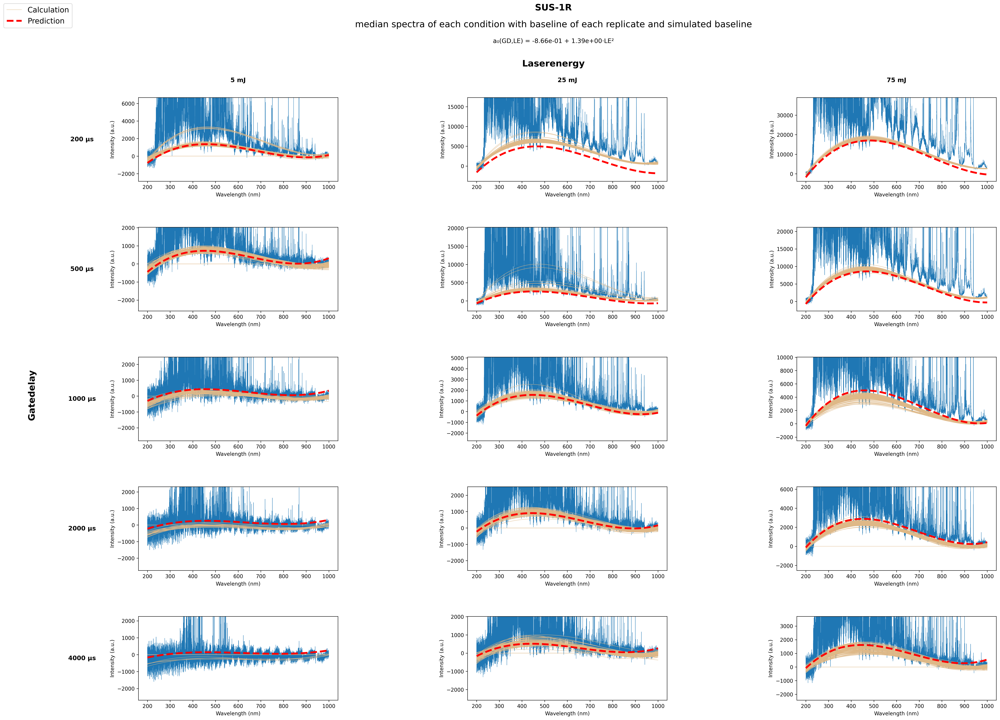

In [9]:
dataset.plot_dataset(type_list=["stability"], baseline_model=baseline_model, deg_min=3, deg_max=3, width_wvn=40, detailfactor=10, endpoint_weight=10000, reverse=True)